If you get IOPub limit errors with Plotly restart Juypter with:

In [ ]:
!jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000

Now start here:

In [99]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

init_notebook_mode(connected=True)

import numpy as np
import pandas as pd
from statistics import mean, mode

from sklearn.preprocessing import scale, MinMaxScaler, StandardScaler, Imputer, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import calinski_harabaz_score, silhouette_score

pca=PCA()
tsne=TSNE()
le=LabelEncoder()

from itertools import cycle, islice

import seaborn as sns


import matplotlib.pyplot as plt
%matplotlib inline

# Clustering the Flights Dataset

## Load Dataset

In [100]:
flights_df = pd.read_csv('./Data/dat_F_sub.csv', index_col='Unnamed: 0')
print(len(flights_df))
flights_df.head()

3584


,Airfield,Flight_ID,Sch_Departure,Act_Departure,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,Year,...,max,mean_WTL,mean_City_Flag,mode_BFO_Dest_City,sum_city_mode,N_of_Dest_City,mode_BFO_Dest_Country_Code,sum_country_mode,N_of_Dest_Country,Delay_in_Seconds
1,AUC,18095,1851408360,1851408360,2 - MORNING,1 - WEEKDAY,5 - FRI,09 - SEP,3 - SUMMER,2028,...,10.0,0,0.0,BORQUE,55,1,BOR,55,1,0
2,AUC,18096,1851408780,1851408780,2 - MORNING,1 - WEEKDAY,5 - FRI,09 - SEP,3 - SUMMER,2028,...,11.0,0,0.0,VES033,38,1,VES,38,1,0
3,AUC,18097,1851410760,1851410760,2 - MORNING,1 - WEEKDAY,5 - FRI,09 - SEP,3 - SUMMER,2028,...,11.0,0,0.0,BORQUE,32,1,BOR,32,1,0
4,AUC,18098,1851411960,1851411960,2 - MORNING,1 - WEEKDAY,5 - FRI,09 - SEP,3 - SUMMER,2028,...,8.0,0,0.0,VES064,21,1,VES,21,1,0
5,AUC,18099,1851413760,1851413760,2 - MORNING,1 - WEEKDAY,5 - FRI,09 - SEP,3 - SUMMER,2028,...,14.0,0,0.0,BORCWL,50,2,BOR,57,1,0


### Objectives
In this case, our objective is to cluster the flights into groups of "similar" flights based on the various attributes such as size and destination. Since most airfiels have a regular daily or weekly flight schedule, we hope to see different instances of a scheduled flight clustered together. For example, one might expect the "8am Monday flights to Borque" to form a cluster.


In [101]:
flights_df.columns

Index(['Airfield', 'Flight_ID', 'Sch_Departure', 'Act_Departure',
       'Time_of_Day', 'Period_of_Week', 'Day_of_Week', 'Month', 'Season',
       'Year', 'tot_pass', 'N', 'min', 'mean', 'median', 'max', 'mean_WTL',
       'mean_City_Flag', 'mode_BFO_Dest_City', 'sum_city_mode',
       'N_of_Dest_City', 'mode_BFO_Dest_Country_Code', 'sum_country_mode',
       'N_of_Dest_Country', 'Delay_in_Seconds'],
      dtype='object')

The 15 numerical variables are:
* Sch_Departure
* Act_Departure
* tot_pass
* N
* min
* mean
* median
* max
* mean_WTL
* mean_City_Flag
* sum_city_mode
* N_of_Dest_City
* sum_country_mode
* N_of_Dest_Country
* Delay_in_Seconds

## Data Reduction
We reduce the dataset to contain only the numerical variables.

In [102]:
flights_num=flights_df.loc[:,['Sch_Departure', 'Act_Departure',
       'tot_pass', 'N', 'min', 'mean', 'median', 'max', 'mean_WTL',
       'mean_City_Flag',  'sum_city_mode',
       'N_of_Dest_City',  'sum_country_mode',
       'N_of_Dest_Country', 'Delay_in_Seconds']]
flights_num.head()

,Sch_Departure,Act_Departure,tot_pass,N,min,mean,median,max,mean_WTL,mean_City_Flag,sum_city_mode,N_of_Dest_City,sum_country_mode,N_of_Dest_Country,Delay_in_Seconds
1,1851408360,1851408360,55,19,2.0,6.157895,7.0,10.0,0,0.0,55,1,55,1,0
2,1851408780,1851408780,38,22,2.0,6.636364,6.0,11.0,0,0.0,38,1,38,1,0
3,1851410760,1851410760,32,26,2.0,4.384615,4.0,11.0,0,0.0,32,1,32,1,0
4,1851411960,1851411960,21,20,4.0,5.550000,5.5,8.0,0,0.0,21,1,21,1,0
5,1851413760,1851413760,57,47,1.0,6.978723,7.0,14.0,0,0.0,50,2,57,1,0


We will now look at the pairs plot to see if some columns are redundant.

/Users/ionabuchanan/anaconda/lib/python3.6/site-packages/matplotlib/axes/_base.py:2917: UserWarning:

Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0

/Users/ionabuchanan/anaconda/lib/python3.6/site-packages/matplotlib/axes/_base.py:3193: UserWarning:

Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0



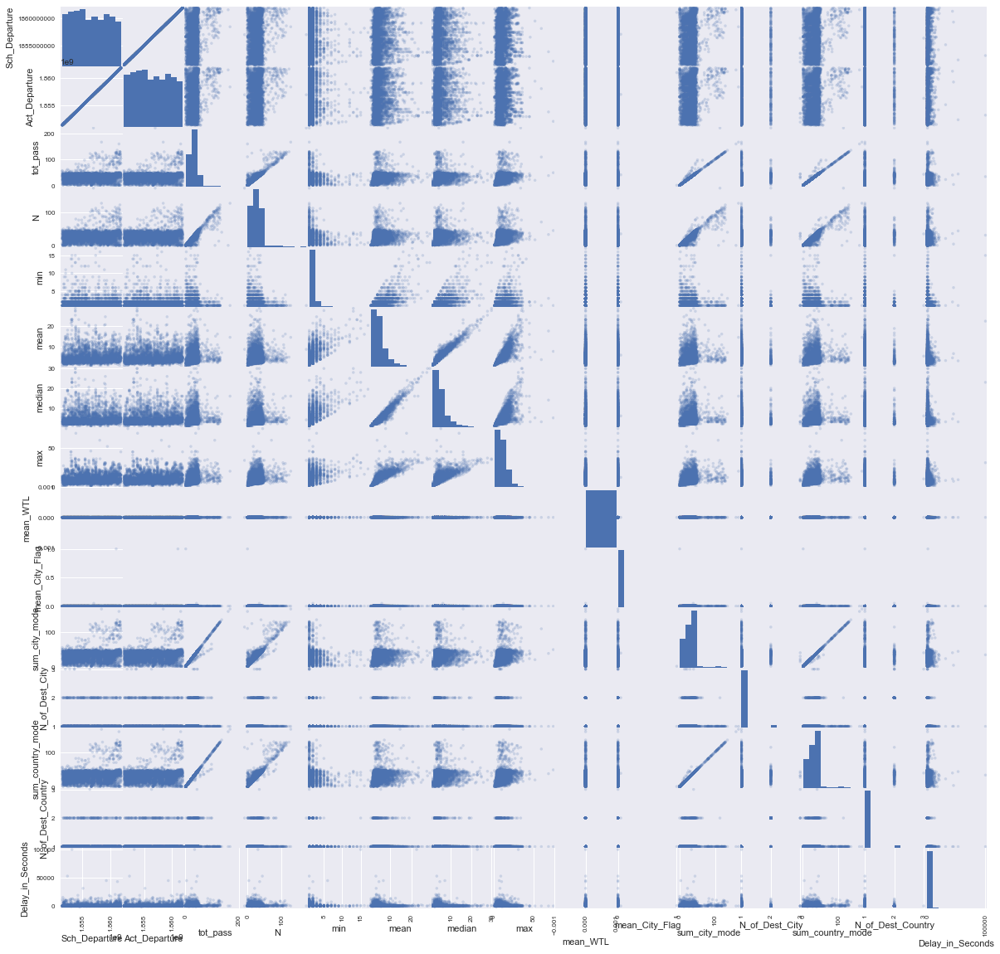

In [103]:
pd.plotting.scatter_matrix(flights_num, figsize=(20,20), alpha=0.2)
plt.show()

From the pairs plot we see some rows with very similar distributions:
* Sch_Departure and Act_Departure (Since Actual departure is captured by scheduled departure and delay, we can omit Act_Departure)
* N and tot_pass (omit tot_pass)
* mean and median (omit median... one could possibly also omit max because it is similar but if we are keeping min we should probably keep max)
* sum_city_mode and sum_country_mode (omit sum_country_mode)
* N_of_Dest_City and N_of_Dest_Country (omit N_of_Dest_Country)

Since we removed essentially "duplicate" variables, the results should not differ drastically.

We also notice that all observations have mean_WTL=0 so this variable is not really informative.


Our reduced dataset becomes:

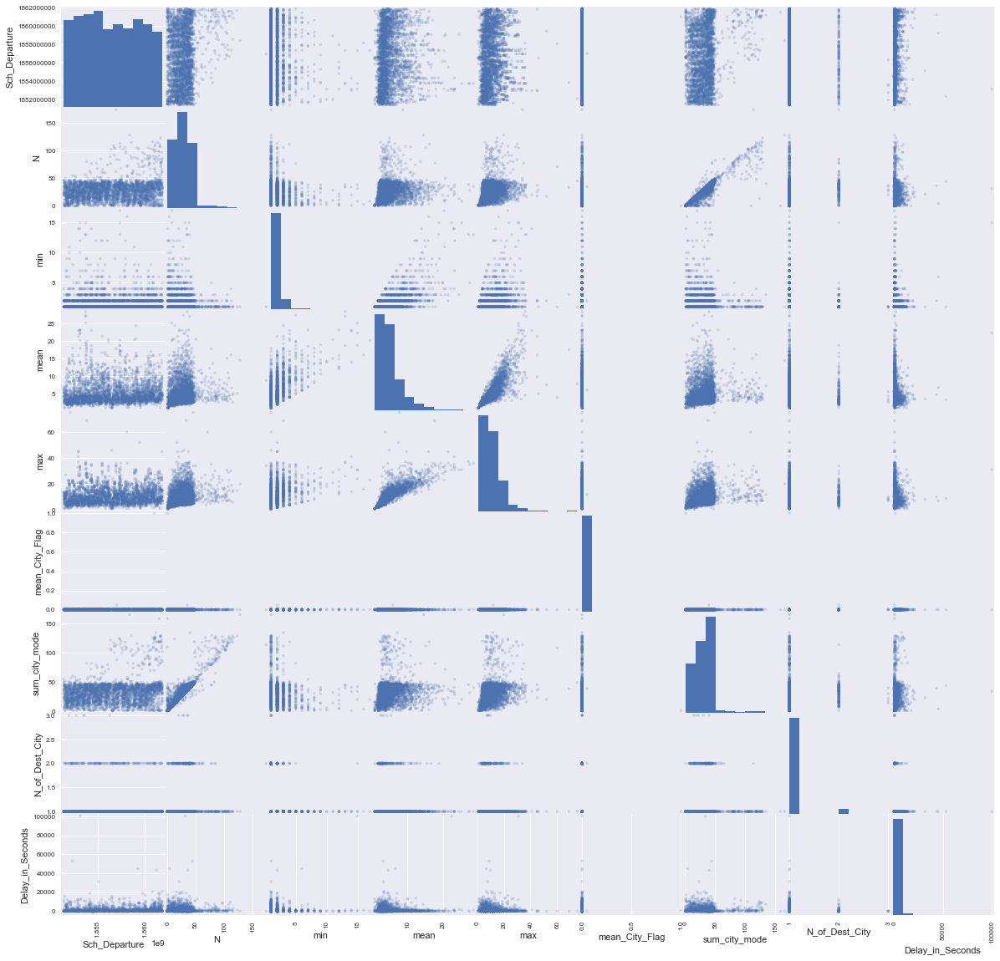

In [104]:
flights_red=flights_df.loc[:,['Sch_Departure', 'N', 'min', 'mean', 'max', 'mean_City_Flag', 
                              'sum_city_mode','N_of_Dest_City', 'Delay_in_Seconds']]

pd.plotting.scatter_matrix(flights_red, figsize=(20,20), alpha=0.2)
plt.show()

We only have 10 variables which should be ok for the algorithms we will be using. We don't really need to perform PCA but this can be done using sklearn's PCA or TruncatedSVD (for sparse matrices).

## Imputation
We removed 64 observations with missing values. This is a relatively small proportion of the original dataset but we are still assuming that there is nothing "special" about these 64 observations. I would say this strategy is acceptable but one could also impute the missing values by taking the average of the respective column. This can be done easily using sklearn.preprocessing.Imputer (http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Imputer.html#sklearn.preprocessing.Imputer).

In [105]:
imp = Imputer(missing_values='NaN', strategy='mean', axis=0)
'''flights_red=pd.DataFrame(imp.fit_transform(flights_red), columns =['Sch_Departure', 'N', 'min', 'mean', 
                                                                   'max', 'mean_City_Flag','sum_city_mode',
                                                                   'N_of_Dest_City', 'Delay_in_Seconds'])'''
len(flights_red)

3584

In [106]:
flights_red.dropna(inplace=True)
len(flights_red)

3520

## Standardization

"Standardization of datasets is a common requirement for many machine learning estimators implemented in scikit-learn; they might behave badly if the individual features do not more or less look like standard normally distributed data: Gaussian with zero mean and unit variance." - sklearn

Normalizing the data allows us to normalize the difference between different values. For example, if variable X takes on values 1000 to 10 000 while Y takes values between 0 and 1, the distance between two observations with respect to the X feature is a lot larger than with respect to Y where in fact they might be quite similar. (Ex 1000 and 1005 vs 0.1 and 0.9)

Here, we will use StandardScaler.

In [107]:
flights_red.head()

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds
1,1851408360,19,2.0,6.157895,10.0,0.0,55,1,0
2,1851408780,22,2.0,6.636364,11.0,0.0,38,1,0
3,1851410760,26,2.0,4.384615,11.0,0.0,32,1,0
4,1851411960,20,4.0,5.550000,8.0,0.0,21,1,0
5,1851413760,47,1.0,6.978723,14.0,0.0,50,2,0


In [108]:
sscale=StandardScaler()
mmscale=MinMaxScaler(feature_range=(0, 1))

In [109]:
flights_scaled=pd.DataFrame(sscale.fit_transform(flights_red), columns=flights_red.columns)
flights_scaled.head()

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds
0,-1.700515,-0.532710,0.239247,0.289456,-0.126106,-0.016857,1.278368,-0.222848,-0.301479
1,-1.700375,-0.347547,0.239247,0.436696,0.027490,-0.016857,0.336790,-0.222848,-0.301479
2,-1.699714,-0.100664,0.239247,-0.256237,0.027490,-0.016857,0.004469,-0.222848,-0.301479
3,-1.699313,-0.470989,1.683760,0.102388,-0.433297,-0.016857,-0.604787,-0.222848,-0.301479
4,-1.698712,1.195471,-0.483009,0.542051,0.488277,-0.016857,1.001433,4.234119,-0.301479


## Clustering

We now perform the four clustering algorithms:
* $k$-means
* Hierarchical
* Spectral
* DBSCAN

### Optimize number of clusters

We will first perform a brief hyperparameter search on the number of clusters using the following scores as validation.

Calinski Harabaz Score:
* ratio between the within-cluster dispersion and the between-cluster dispersion
* best value is higher

Silhouette Score:
* The best value is 1 and the worst value is -1
* Values near 0 indicate overlapping clusters. 

In [110]:
idx = range(5,20)

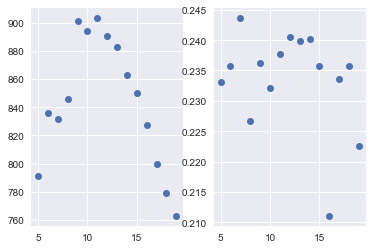

In [111]:
CH=[calinski_harabaz_score(flights_scaled,
                           KMeans(n_clusters=n_clusters).fit(flights_scaled).labels_
                          ) for n_clusters in idx]
silhouette=[silhouette_score(flights_scaled,
                             KMeans(n_clusters=n_clusters).fit(flights_scaled).labels_
                            ) for n_clusters in idx]

plt.subplot(1,2,1)
plt.plot(idx, CH, 'o')
plt.subplot(1,2,2)
plt.plot(idx, silhouette,'o')
plt.show()

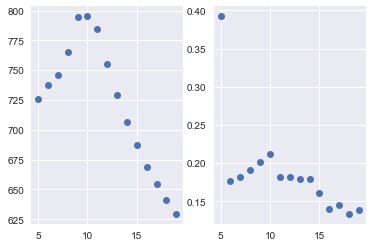

In [112]:
CH=[calinski_harabaz_score(flights_scaled,
                           AgglomerativeClustering(n_clusters=n_clusters, 
                                                   linkage='ward').fit(flights_scaled).labels_
                          ) for n_clusters in idx]
silhouette=[silhouette_score(flights_scaled,
                             AgglomerativeClustering(n_clusters=n_clusters, 
                                                     linkage='ward').fit(flights_scaled).labels_
                            ) for n_clusters in idx]

plt.subplot(1,2,1)
plt.plot(idx, CH, 'o')
plt.subplot(1,2,2)
plt.plot(idx, silhouette,'o')
plt.show()

Spectral is slow...

In [113]:
'''CH=[calinski_harabaz_score(flights_scaled,
                           SpectralClustering(n_clusters=n_clusters, 
                                              eigen_solver='arpack',
                                              affinity="nearest_neighbors"
                                             ).fit(flights_scaled).labels_
                          ) for n_clusters in idx]
silhouette=[silhouette_score(flights_scaled,
                             SpectralClustering(n_clusters=n_clusters, 
                                                eigen_solver='arpack',
                                                affinity="nearest_neighbors"
                                               ).fit(flights_scaled).labels_
                            ) for n_clusters in idx]

plt.subplot(1,2,1)
plt.plot(idx, CH, 'o')
plt.subplot(1,2,2)
plt.plot(idx, silhouette,'o')
plt.show()'''

'CH=[calinski_harabaz_score(flights_scaled,\n                           SpectralClustering(n_clusters=n_clusters, \n                                              eigen_solver=\'arpack\',\n                                              affinity="nearest_neighbors"\n                                             ).fit(flights_scaled).labels_\n                          ) for n_clusters in idx]\nsilhouette=[silhouette_score(flights_scaled,\n                             SpectralClustering(n_clusters=n_clusters, \n                                                eigen_solver=\'arpack\',\n                                                affinity="nearest_neighbors"\n                                               ).fit(flights_scaled).labels_\n                            ) for n_clusters in idx]\n\nplt.subplot(1,2,1)\nplt.plot(idx, CH, \'o\')\nplt.subplot(1,2,2)\nplt.plot(idx, silhouette,\'o\')\nplt.show()'

Hyperparameter search for DBSCAN

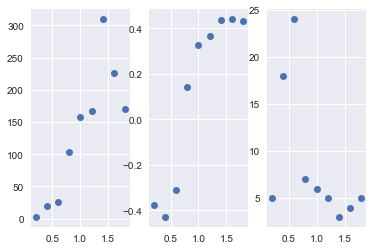

In [114]:
idx=np.arange(0.2,2,0.2)
CH=[calinski_harabaz_score(flights_scaled,
                           DBSCAN(eps=eps).fit(flights_scaled).labels_
                          ) for eps in idx]
silhouette=[silhouette_score(flights_scaled,
                             DBSCAN(eps=eps).fit(flights_scaled).labels_
                            ) for eps in idx]
nclusts=[len(set(DBSCAN(eps=eps).fit(flights_scaled).labels_)) for eps in idx]

plt.subplot(1,3,1)
plt.plot(idx, CH, 'o')
plt.subplot(1,3,2)
plt.plot(idx, silhouette,'o')
plt.subplot(1,3,3)
plt.plot(idx, nclusts,'o')
plt.show()

We now run the clustering algorithms with the optimised cluster counts.

In [115]:
# Create cluster objects
n_clusters=10
eps=1

kmeans = KMeans(n_clusters=n_clusters)
ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
spectral = SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack',affinity="nearest_neighbors")
dbscan = DBSCAN(eps=eps)

In [116]:
clusters={}
for algo in [kmeans, ward, spectral, dbscan]:
    clusters[str(algo).split('(')[0]]=algo.fit(flights_scaled).labels_

/Users/ionabuchanan/anaconda/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



### $k$-Means

In [117]:
cluster_summary=pd.DataFrame(columns=flights_red.columns)
labels=clusters['KMeans']
for label in set(labels):
    temp=flights_red[labels==label]
    for col in temp.columns:
        cluster_summary.set_value(label, [col], mean(temp[col]))
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,cluster_size
0,1856247144,30,1.33533,4.53289,9.5509,0,31,2,545,167.0
1,1858685129,12,1.69399,3.87828,7.39891,0,16,1,1476,549.0
2,1853507371,15,1.35247,3.34437,6.50558,0,17,1,1004,627.0
3,1857038100,35,2,6.02857,12,0.0487805,39,2,0,1.0
4,1854243210,34,1.25289,4.26669,9.44159,0,38,1,572,779.0
5,1856204139,27,2.65471,10.634,21.4843,0,32,1,448,446.0
6,1855539189,15,9.39286,15.4631,20.9643,0,20,1,534,56.0
7,1859654097,84,1.31429,5.65597,14.2762,0,103,1,1902,105.0
8,1856226696,27,5,8.09731,13,0,29,1,54540,5.0
9,1859475796,33,1.30191,4.8521,11.0408,0,38,1,747,785.0


In [118]:
calinski_harabaz_score(flights_scaled,labels), silhouette_score(flights_scaled,labels)

(893.40658034747469, 0.23179180176144698)

### Hierarchical

In [119]:
cluster_summary=pd.DataFrame(columns=flights_red.columns)
labels=clusters['AgglomerativeClustering']
for label in set(labels):
    temp=flights_red[labels==label]
    for col in temp.columns:
        cluster_summary.set_value(label, [col], mean(temp[col]))
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,cluster_size
0,1853678369,23,1.35115,3.77113,7.80184,0,27,1,265,1085.0
1,1855692851,12,8.41892,13.2761,18.1892,0,17,1,442,74.0
2,1856502210,28,6,9.2645,14.25,0,30,1,60345,4.0
3,1855738463,29,2.62044,10.7179,21.4818,0,34,1,283,411.0
4,1858795110,15,1.56804,4.03105,8.08544,0,19,1,876,632.0
5,1857038100,35,2,6.02857,12,0.0487805,39,2,0,1.0
6,1858674564,36,1.27371,5.02621,11.461,0,40,1,295,833.0
7,1856264135,30,1.35714,4.60497,9.67262,0,31,2,541,168.0
8,1855903803,22,1.29108,3.7749,8.32864,0,26,1,7018,213.0
9,1859953741,85,1.28283,5.35805,13.3838,0,104,1,2041,99.0


In [120]:
calinski_harabaz_score(flights_scaled,labels), silhouette_score(flights_scaled,labels)

(795.22663461067896, 0.21198917662758945)

### Spectral

In [121]:
cluster_summary=pd.DataFrame(columns=flights_red.columns)
labels=clusters['SpectralClustering']
for label in set(labels):
    temp=flights_red[labels==label]
    for col in temp.columns:
        cluster_summary.set_value(label, [col], mean(temp[col]))
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,cluster_size
0,1856268714,30,1.36095,4.6134,9.68639,0.000288642,31,2,538,169.0
1,1858804655,34,1.00487,4.2228,9.86688,0,39,1,380,616.0
2,1858974731,12,1.44584,3.53073,6.89924,0,15,1,669,397.0
3,1859936570,85,1.28571,5.36247,13.4388,0,104,1,1927,98.0
4,1856230651,20,1.39487,3.72413,7.87179,0,24,1,8897,195.0
5,1853558215,16,1.0026,3.09509,6.3724,0,19,1,232,384.0
6,1853534476,36,1,3.49122,7.59409,0,39,1,411,372.0
7,1855759702,21,5.0211,13.1951,21.5232,0,26,1,282,237.0
8,1856867657,30,1.95928,7.02223,15.4407,0,35,1,468,835.0
9,1854000237,13,2.1659,3.92836,6.99539,0,16,1,234,217.0


In [122]:
calinski_harabaz_score(flights_scaled,labels), silhouette_score(flights_scaled,labels)

(444.87595838529109, 0.13819174117556784)

Some cluster descriptions for above models:
* Large flights
* Long delay
* Very long delay
* Small flights with short wait-times
* Small flights with long wait-times
* Multiple destination cities

### DBSCAN

In [123]:
cluster_summary=pd.DataFrame(columns=flights_red.columns)
labels=clusters['DBSCAN']
for label in set(labels):
    temp=flights_red[labels==label]
    for col in temp.columns:
        cluster_summary.set_value(label, [col], mean(temp[col]))
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,cluster_size
0,1856361240,25,1.49222,4.77576,9.94535,0,29,1,679,3019.0
1,1855529890,29,1.15385,3.31118,6.97115,0,29,2,205,104.0
2,1854714372,37,1,3.8203,17.4,0,42,2,396,5.0
3,1859456237,83,1.16129,3.98105,9.77419,0,92,1,752,31.0
4,1858028580,32,1.4,16.4464,31.6,0,40,1,0,5.0
-1,1857716386,36,3.3736,9.48793,19.0787,0.000137024,45,1,3281,356.0


In [124]:
calinski_harabaz_score(flights_scaled,labels), silhouette_score(flights_scaled,labels)

(158.39656482174544, 0.32657388966958784)

3 main clusters:
* Large flights
* Multiple destination cities
* Single destination city


### Visualise
The data is reduced to 2 dimensions for plotting and colours represent clusters. Use the dropdown menu to choose between clustering algorithms.

In [125]:
#reduce to 2D for plotting
%time flights_2D = tsne.fit_transform(flights_scaled)

CPU times: user 1min 8s, sys: 6.39 s, total: 1min 14s
Wall time: 1min 15s


In [126]:
data=[]

for algo in [kmeans, ward, spectral, dbscan]:
    labels=clusters[str(algo).split('(')[0]]
    
    colors = sns.color_palette("hls", len(set(labels)))
    
    trace=go.Scatter(x=[x[0] for x in flights_2D], 
                     y=[x[1] for x in flights_2D],
                     mode='markers',
                     marker={'color': ['rgb{}'.format(colors[x]) if x!=-1 else 'grey' for x in labels],
                            'opacity':0.8},
                     text=[str(x) for x in labels],
                     name=''
                    )
    data.append(trace)
    
data.append(go.Scatter(x=[x[0] for x in flights_2D], 
                     y=[x[1] for x in flights_2D],
                     mode='markers',
                     marker={'color': 'grey'},
                     name=''
                    ))

updatemenus = list([
    dict(buttons=list([ 
            dict(label = 'k-means',
                 method = 'update',
                 args = [{'visible': [True, False, False, False, False]},
                         {'title': 'K-Means'}]),
            dict(label = 'hierarchical',
                     method = 'update',
                     args = [{'visible': [False, True, False, False, False]},
                             {'title': 'Hierarchical (ward)'}]),
            dict(label = 'spectral',
                     method = 'update',
                     args = [{'visible': [False, False, True, False, False]},
                             {'title': 'Spectral Clustering'}]),
            dict(label = 'dbscan',
                     method = 'update',
                     args = [{'visible': [False, False, False, True, False]},
                             {'title': 'DBSCAN'}]),
        
        ]),
    )
])

layout = dict(title='Select clustering', showlegend=False,
              updatemenus=updatemenus, hovermode='closest')

fig = dict(data=data, layout=layout)

iplot(fig)

$k$-means, hierarchical and spectral clustering gave similar results. Since the plot only shows a flattened version of the dataset, it is hard to tell which of these performed the best. 

DBSCAN found the three main clusters along with a couple of small tight clusters. The grey points are outliers. Unlike most other clustering algorithms DBSCAN identifies not only clusters but outliers. This can be useful but different values of eps and min_cluster_size will give different results.

## PCA

We don't always have to perform PCA but here is the clustering with the reduced data.

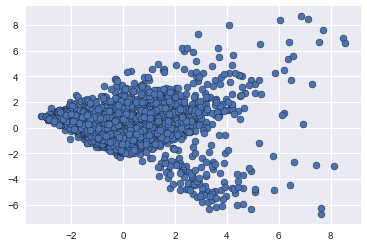

In [127]:
pca=PCA(n_components=2)
X=pca.fit_transform(flights_scaled)
plt.scatter(X[:, 0], X[:, 1],cmap=plt.cm.spectral, edgecolor='k')

In [128]:
n_clusters=3
eps=0.6
min_samples=5

kmeans = KMeans(n_clusters=n_clusters)
ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
spectral = SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack',affinity="nearest_neighbors")
dbscan = DBSCAN(eps=eps,min_samples=min_samples)

clusters={}
for algo in [kmeans, ward, spectral, dbscan]:
    clusters[str(algo).split('(')[0]]=algo.fit(X).labels_
    labels=clusters[str(algo).split('(')[0]]
    print(str(algo).split('(')[0])
    print('CH :', calinski_harabaz_score(X,labels),'\tSilhouette: ', silhouette_score(X,labels, metric='manhattan'))

KMeans
CH : 2076.43470992 	Silhouette:  0.385377690735
AgglomerativeClustering
CH : 1711.12618156 	Silhouette:  0.352335494553
SpectralClustering
CH : 1379.61097051 	Silhouette:  0.322003828075
DBSCAN
CH : 232.285709419 	Silhouette:  0.521370605302


In [129]:
data=[]

for algo in [kmeans, ward, spectral, dbscan]:
    labels=clusters[str(algo).split('(')[0]]
    
    colors = sns.color_palette("hls", len(set(labels)))
    
    trace=go.Scatter(x=X[:, 0], 
                     y=X[:, 1],
                     mode='markers',
                     marker={'color': ['rgb{}'.format(colors[x]) if x!=-1 else 'grey'  for x in labels], 
                             'opacity': 0.5},
                     text=[str(x) for x in labels],
                     name=''
                    )
    data.append(trace)
    
data.append(go.Scatter(x=X[:, 0], 
                     y=X[:, 1],
                     mode='markers',
                     marker={'color': 'grey'},
                     name=''
                    ))

updatemenus = list([
    dict(buttons=list([ 
            dict(label = 'k-means',
                 method = 'update',
                 args = [{'visible': [True, False, False, False, False]},
                         {'title': 'K-Means'}]),
            dict(label = 'hierarchical',
                     method = 'update',
                     args = [{'visible': [False, True, False, False, False]},
                             {'title': 'Hierarchical (ward)'}]),
            dict(label = 'spectral',
                     method = 'update',
                     args = [{'visible': [False, False, True, False, False]},
                             {'title': 'Spectral Clustering'}]),
            dict(label = 'dbscan',
                     method = 'update',
                     args = [{'visible': [False, False, False, True, False]},
                             {'title': 'DBSCAN'}]),
        
        ]),
    )
])

layout = dict(title='Select clustering', showlegend=False,
              updatemenus=updatemenus, hovermode='closest')

fig = dict(data=data, layout=layout)

iplot(fig)

When clustering on the two dimensional dataset, hierarchical clustering proves to perform the best.

Here are the clusters found by the hierarchical clustering algorithm:

In [132]:
cluster_summary=pd.DataFrame(columns=flights_red.columns)
labels=clusters['AgglomerativeClustering']
for label in set(labels):
    temp=flights_red[labels==label]
    for col in temp.columns:
        cluster_summary.set_value(label, [col], mean(temp[col]))
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,cluster_size
0,1857297487,42,1.13901,4.23262,9.74888,4.37493e-05,47,1,758,1115.0
1,1856728426,25,2.81473,9.16429,18.1224,0,31,1,832,923.0
2,1855760154,17,1.35358,3.49988,7.0803,0,20,1,1115,1482.0


## Categorical Variables
We now repeat, but including categorical variables.

### Data

In [133]:
flights_df.columns

Index(['Airfield', 'Flight_ID', 'Sch_Departure', 'Act_Departure',
       'Time_of_Day', 'Period_of_Week', 'Day_of_Week', 'Month', 'Season',
       'Year', 'tot_pass', 'N', 'min', 'mean', 'median', 'max', 'mean_WTL',
       'mean_City_Flag', 'mode_BFO_Dest_City', 'sum_city_mode',
       'N_of_Dest_City', 'mode_BFO_Dest_Country_Code', 'sum_country_mode',
       'N_of_Dest_Country', 'Delay_in_Seconds'],
      dtype='object')

The categorical variables are:
* Time_of_Day
* Period_of_Week
* Day_of_Week
* Month
* Season
* mode_BFO_Dest_City
* mode_BFO_Dest_Country_Code

In [134]:
flights_red.columns

Index(['Sch_Departure', 'N', 'min', 'mean', 'max', 'mean_City_Flag',
       'sum_city_mode', 'N_of_Dest_City', 'Delay_in_Seconds'],
      dtype='object')

We must drop/impute missing values and encode categorical variables.

In [135]:
flights_df.dropna(inplace=True)

flights_cat=flights_df.loc[:,['Sch_Departure', 'N', 'min', 'mean', 'max', 'mean_City_Flag',
                              'sum_city_mode', 'N_of_Dest_City', 'Delay_in_Seconds',
                              'Time_of_Day','Period_of_Week','Day_of_Week','Month','Season',
                              'mode_BFO_Dest_City','mode_BFO_Dest_Country_Code']]

for col in ['Time_of_Day','Period_of_Week','Day_of_Week','Month','Season',
                              'mode_BFO_Dest_City','mode_BFO_Dest_Country_Code']:
    flights_cat[col]=le.fit_transform(flights_cat[col])
    
flights_cat.head()

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,mode_BFO_Dest_City,mode_BFO_Dest_Country_Code
1,1851408360,19,2.0,6.157895,10.0,0.0,55,1,0,1,0,4,0,0,2,0
2,1851408780,22,2.0,6.636364,11.0,0.0,38,1,0,1,0,4,0,0,7,3
3,1851410760,26,2.0,4.384615,11.0,0.0,32,1,0,1,0,4,0,0,2,0
4,1851411960,20,4.0,5.550000,8.0,0.0,21,1,0,1,0,4,0,0,8,3
5,1851413760,47,1.0,6.978723,14.0,0.0,50,2,0,1,0,4,0,0,1,0


In [136]:
#scale data
flights_cat_scaled=pd.DataFrame(sscale.fit_transform(flights_cat), columns=flights_cat.columns)
flights_cat_scaled.head()

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,mode_BFO_Dest_City,mode_BFO_Dest_Country_Code
0,-1.700515,-0.532710,0.239247,0.289456,-0.126106,-0.016857,1.278368,-0.222848,-0.301479,-1.192479,-0.645809,0.504117,-1.312446,-1.704925,-0.455469,-0.587240
1,-1.700375,-0.347547,0.239247,0.436696,0.027490,-0.016857,0.336790,-0.222848,-0.301479,-1.192479,-0.645809,0.504117,-1.312446,-1.704925,1.635365,1.859978
2,-1.699714,-0.100664,0.239247,-0.256237,0.027490,-0.016857,0.004469,-0.222848,-0.301479,-1.192479,-0.645809,0.504117,-1.312446,-1.704925,-0.455469,-0.587240
3,-1.699313,-0.470989,1.683760,0.102388,-0.433297,-0.016857,-0.604787,-0.222848,-0.301479,-1.192479,-0.645809,0.504117,-1.312446,-1.704925,2.053532,1.859978
4,-1.698712,1.195471,-0.483009,0.542051,0.488277,-0.016857,1.001433,4.234119,-0.301479,-1.192479,-0.645809,0.504117,-1.312446,-1.704925,-0.873636,-0.587240


### Clustering with Categorical Variables
We perform a hyperparameter search and then cluster.

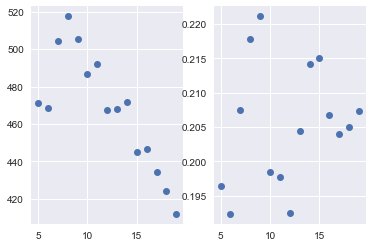

In [137]:
idx = range(5,20)
CH=[calinski_harabaz_score(flights_cat_scaled,
                           KMeans(n_clusters=n_clusters).fit(flights_cat_scaled).labels_
                          ) for n_clusters in idx]
silhouette=[silhouette_score(flights_cat_scaled,
                             KMeans(n_clusters=n_clusters).fit(flights_cat_scaled).labels_
                            ) for n_clusters in idx]

plt.subplot(1,2,1)
plt.plot(idx, CH, 'o')
plt.subplot(1,2,2)
plt.plot(idx, silhouette,'o')
plt.show()

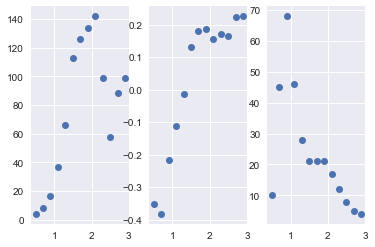

In [138]:
idx=np.arange(0.5,3,0.2)
CH=[calinski_harabaz_score(flights_cat_scaled,
                           DBSCAN(eps=eps).fit(flights_cat_scaled).labels_
                          ) for eps in idx]
silhouette=[silhouette_score(flights_cat_scaled,
                             DBSCAN(eps=eps).fit(flights_cat_scaled).labels_
                            ) for eps in idx]
nclusts=[len(set(DBSCAN(eps=eps).fit(flights_cat_scaled).labels_)) for eps in idx]

plt.subplot(1,3,1)
plt.plot(idx, CH, 'o')
plt.subplot(1,3,2)
plt.plot(idx, silhouette,'o')
plt.subplot(1,3,3)
plt.plot(idx, nclusts,'o')
plt.show()

In [139]:
n_clusters=8
eps=1.5
min_samples=10

kmeans = KMeans(n_clusters=n_clusters)
ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
spectral = SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack',affinity="nearest_neighbors")
dbscan = DBSCAN(eps=eps,min_samples=min_samples)

clusters={}
for algo in [kmeans, ward, spectral, dbscan]:
    clusters[str(algo).split('(')[0]]=algo.fit(flights_cat_scaled).labels_

$k$-Means

In [140]:
cluster_summary=pd.DataFrame(columns=flights_cat.columns)
labels=clusters['KMeans']
for label in set(labels):
    temp=flights_df[labels==label]
    for col in flights_cat.columns:
        try:
            cluster_summary.set_value(label, [col], mean(temp[col]))
        except:
            try:
                cluster_summary.set_value(label, [col], mode(temp[col]))
            except:
                None
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,mode_BFO_Dest_City,mode_BFO_Dest_Country_Code,cluster_size
0,1857714952,26,1.48059,4.85614,10.4104,0,30,1,873,4 - EVENING,2 - WEEKEND,7 - SUN,10 - OCT,4 - AUTUMN,BORQUE,BOR,541.0
1,1857718158,25,1.40488,4.41187,9.57492,0,29,1,995,4 - EVENING,1 - WEEKDAY,2 - TUE,10 - OCT,4 - AUTUMN,BORQUE,BOR,1188.0
2,1856239612,26,4.21203,12.6251,22.4114,0,31,1,765,2 - MORNING,1 - WEEKDAY,4 - THU,10 - OCT,4 - AUTUMN,BORQUE,BOR,316.0
3,1852723506,23,1.51667,4.43884,9.01111,0,26,1,981,3 - AFTERNOON,1 - WEEKDAY,6 - SAT,09 - SEP,3 - SUMMER,VES033,VES,180.0
4,1857979128,27,1.47495,4.77094,10.3006,0,31,1,1001,3 - AFTERNOON,1 - WEEKDAY,NaN,12 - DEC,4 - AUTUMN,VES033,VES,539.0
5,1852693101,25,1.33538,3.92054,8.21077,0,27,1,694,3 - AFTERNOON,1 - WEEKDAY,NaN,09 - SEP,3 - SUMMER,BORQUE,BOR,650.0
6,1859717805,84,1.28571,5.542,14.0762,0,102,1,1925,4 - EVENING,1 - WEEKDAY,6 - SAT,12 - DEC,4 - AUTUMN,BORSAF,BOR,105.0
7,1857038100,35,2,6.02857,12,0.0487805,39,2,0,3 - AFTERNOON,2 - WEEKEND,7 - SUN,11 - NOV,4 - AUTUMN,BORQUE,BOR,1.0


In [141]:
calinski_harabaz_score(flights_cat_scaled,labels), silhouette_score(flights_cat_scaled,labels, metric='euclidean')

(483.79151850504013, 0.21974199643310308)

Hierarchical

In [142]:
cluster_summary=pd.DataFrame(columns=flights_cat.columns)
labels=clusters['AgglomerativeClustering']
for label in set(labels):
    temp=flights_df[labels==label]
    for col in flights_cat.columns:
        try:
            cluster_summary.set_value(label, [col], mean(temp[col]))
        except:
            try:
                cluster_summary.set_value(label, [col], mode(temp[col]))
            except:
                None
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,mode_BFO_Dest_City,mode_BFO_Dest_Country_Code,cluster_size
0,1857457257,25,1.34446,4.1198,8.8263,0,29,1,1634,4 - EVENING,1 - WEEKDAY,1 - MON,10 - OCT,4 - AUTUMN,BORQUE,BOR,1019.0
1,1852723749,24,1.33747,3.92839,8.23691,0,27,1,461,3 - AFTERNOON,1 - WEEKDAY,6 - SAT,09 - SEP,3 - SUMMER,BORQUE,BOR,726.0
2,1857925064,27,1.50096,4.90566,10.6046,0,31,1,980,3 - AFTERNOON,1 - WEEKDAY,7 - SUN,12 - DEC,4 - AUTUMN,VES033,VES,521.0
3,1856730909,26,3.38866,10.2176,19.4265,0,31,1,301,2 - MORNING,1 - WEEKDAY,4 - THU,10 - OCT,4 - AUTUMN,BORQUE,BOR,476.0
4,1857038100,35,2,6.02857,12,0.0487805,39,2,0,3 - AFTERNOON,2 - WEEKEND,7 - SUN,11 - NOV,4 - AUTUMN,BORQUE,BOR,1.0
5,1856264135,30,1.35714,4.60497,9.67262,0,31,2,541,4 - EVENING,1 - WEEKDAY,6 - SAT,10 - OCT,4 - AUTUMN,BORQUE,BOR,168.0
6,1857727092,25,1.53033,5.05733,10.5284,0,30,1,706,2 - MORNING,2 - WEEKEND,7 - SUN,10 - OCT,4 - AUTUMN,BORQUE,BOR,511.0
7,1859860902,85,1.28571,5.42189,13.5408,0,103,1,1630,4 - EVENING,1 - WEEKDAY,6 - SAT,12 - DEC,4 - AUTUMN,BORSAF,BOR,98.0


In [143]:
calinski_harabaz_score(flights_cat_scaled,labels), silhouette_score(flights_cat_scaled,labels, metric='euclidean')

(473.20757739967104, 0.2025972942582947)

Spectral

In [144]:
cluster_summary=pd.DataFrame(columns=flights_cat.columns)
labels=clusters['SpectralClustering']
for label in set(labels):
    temp=flights_df[labels==label]
    for col in flights_cat.columns:
        try:
            cluster_summary.set_value(label, [col], mean(temp[col]))
        except:
            try:
                cluster_summary.set_value(label, [col], mode(temp[col]))
            except:
                None
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,mode_BFO_Dest_City,mode_BFO_Dest_Country_Code,cluster_size
0,1857895366,27,1.5392,4.92461,10.587,0,31,1,960,3 - AFTERNOON,1 - WEEKDAY,4 - THU,10 - OCT,4 - AUTUMN,VES033,VES,523.0
1,1857754784,26,1.53244,5.09001,10.8607,0,30,1,704,2 - MORNING,2 - WEEKEND,7 - SUN,10 - OCT,4 - AUTUMN,BORQUE,BOR,524.0
2,1857671780,29,1.9119,5.87853,12.0148,0,34,1,1183,2 - MORNING,1 - WEEKDAY,4 - THU,10 - OCT,4 - AUTUMN,BORQUE,BOR,1487.0
3,1852723580,23,1.45638,4.43008,9.04027,0,27,1,661,3 - AFTERNOON,1 - WEEKDAY,3 - WED,09 - SEP,3 - SUMMER,BORQUE,BOR,447.0
4,1852699192,26,1.39378,4.15623,8.67358,0,29,1,378,3 - AFTERNOON,2 - WEEKEND,6 - SAT,09 - SEP,3 - SUMMER,BORQUE,BOR,193.0
5,1858513184,34,1.77419,6.97731,13.2258,0,30,2,232,2 - MORNING,1 - WEEKDAY,6 - SAT,11 - NOV,4 - AUTUMN,VES064,VES,31.0
6,1852732909,23,1.53889,4.5982,9.23333,0,26,1,977,3 - AFTERNOON,1 - WEEKDAY,6 - SAT,09 - SEP,3 - SUMMER,VES033,VES,180.0
7,1855841819,30,1.26667,4.10627,8.95556,0.000361337,31,2,616,4 - EVENING,1 - WEEKDAY,NaN,10 - OCT,4 - AUTUMN,BORQUE,BOR,135.0


In [145]:
calinski_harabaz_score(flights_cat_scaled,labels), silhouette_score(flights_cat_scaled,labels, metric='euclidean')

(299.75182875071511, 0.16790785865515107)

DBSCAN

In [146]:
cluster_summary=pd.DataFrame(columns=flights_cat.columns)
labels=clusters['DBSCAN']
for label in set(labels):
    temp=flights_df[labels==label]
    for col in flights_cat.columns:
        try:
            cluster_summary.set_value(label, [col], mean(temp[col]))
        except:
            try:
                cluster_summary.set_value(label, [col], mode(temp[col]))
            except:
                None
    cluster_summary.set_value(label, 'cluster_size', len(temp))
cluster_summary

,Sch_Departure,N,min,mean,max,mean_City_Flag,sum_city_mode,N_of_Dest_City,Delay_in_Seconds,Time_of_Day,Period_of_Week,Day_of_Week,Month,Season,mode_BFO_Dest_City,mode_BFO_Dest_Country_Code,cluster_size
0,1852697274,23,1.41827,4.12429,8.42067,0,27,1,430,3 - AFTERNOON,1 - WEEKDAY,3 - WED,09 - SEP,3 - SUMMER,BORQUE,BOR,416.0
1,1852785678,24,1.32609,3.85109,7.76087,0,26,1,663,3 - AFTERNOON,1 - WEEKDAY,1 - MON,09 - SEP,3 - SUMMER,VES033,VES,92.0
2,1852684330,26,1.31461,3.92508,8.15169,0,29,1,240,3 - AFTERNOON,2 - WEEKEND,NaN,09 - SEP,3 - SUMMER,BORQUE,BOR,178.0
3,1852843191,24,1.11905,3.62036,7.71429,0,27,1,108,3 - AFTERNOON,2 - WEEKEND,6 - SAT,09 - SEP,3 - SUMMER,VES064,VES,42.0
4,1852690842,33,1,2.69524,6.14286,0,33,2,342,3 - AFTERNOON,1 - WEEKDAY,1 - MON,09 - SEP,3 - SUMMER,BORQUE,BOR,14.0
5,1857598201,26,1.42384,4.7285,9.96689,0,30,1,440,2 - MORNING,2 - WEEKEND,7 - SUN,10 - OCT,4 - AUTUMN,BORQUE,BOR,453.0
6,1857534139,28,1.23,3.84642,8.31,0,32,1,517,3 - AFTERNOON,2 - WEEKEND,7 - SUN,10 - OCT,4 - AUTUMN,VES033,VES,100.0
7,1857664336,26,1.50939,5.04497,10.5939,0,30,1,577,2 - MORNING,1 - WEEKDAY,2 - TUE,10 - OCT,4 - AUTUMN,BORQUE,BOR,1172.0
8,1857832067,29,1.20155,3.86017,8.64341,0,33,1,580,3 - AFTERNOON,1 - WEEKDAY,1 - MON,11 - NOV,4 - AUTUMN,VES033,VES,258.0
9,1856134824,29,1.05,2.87908,6.55,0,31,2,501,4 - EVENING,1 - WEEKDAY,1 - MON,10 - OCT,4 - AUTUMN,BORQUE,BOR,20.0


In [147]:
calinski_harabaz_score(flights_cat_scaled,labels), silhouette_score(flights_cat_scaled,labels, metric='euclidean')

(158.74538706314482, 0.11665298386697975)

### Visualise (again)

In [148]:
#reduce to 2D for plotting
%time flights_2D = tsne.fit_transform(flights_cat)

CPU times: user 52.7 s, sys: 6.86 s, total: 59.6 s
Wall time: 1min 1s


In [149]:
data=[]

for algo in [kmeans, ward, spectral, dbscan]:
    labels=clusters[str(algo).split('(')[0]]
    
    colors = sns.color_palette("hls", len(set(labels)))
    
    trace=go.Scatter(x=[x[0] for x in flights_2D], 
                     y=[x[1] for x in flights_2D],
                     mode='markers',
                     marker={'color': ['rgb{}'.format(colors[x]) if x!=-1 else 'grey'  for x in labels],
                            'opacity':0.5},
                     text=[str(x) for x in labels],
                     name=''
                    )
    data.append(trace)
    
data.append(go.Scatter(x=[x[0] for x in flights_2D], 
                     y=[x[1] for x in flights_2D],
                     mode='markers',
                     marker={'color': 'grey'},
                     name=''
                    ))

updatemenus = list([
    dict(buttons=list([ 
            dict(label = 'k-means',
                 method = 'update',
                 args = [{'visible': [True, False, False, False, False]},
                         {'title': 'K-Means'}]),
            dict(label = 'hierarchical',
                     method = 'update',
                     args = [{'visible': [False, True, False, False, False]},
                             {'title': 'Hierarchical (ward)'}]),
            dict(label = 'spectral',
                     method = 'update',
                     args = [{'visible': [False, False, True, False, False]},
                             {'title': 'Spectral Clustering'}]),
            dict(label = 'dbscan',
                     method = 'update',
                     args = [{'visible': [False, False, False, True, False]},
                             {'title': 'DBSCAN'}]),
        
        ]),
    )
])

layout = dict(title='Select clustering', showlegend=False,
              updatemenus=updatemenus, hovermode='closest')

fig = dict(data=data, layout=layout)

iplot(fig)

Again, it's hard to validate visually but, despite the numerical metrics, it looks like DBSCAN and k-means performed better than hierarchical and spectral.